# Exploratory Data Analysis (EDA) Wine Quality dataset

We will analyze the well-known [wine dataset](https://archive.ics.uci.edu/ml/datasets/wine+quality) using our newly gained skills in this part. Each wine is described with several attributes obtained by physicochemical tests and by its quality (from 1 to 10). This dataset is perfect for many ML tasks such as:

- Testing Outlier detection algorithms that can detect the few excellent or poor wines
- Modeling the relationship between wine quality and wine attributes (using regression or classification)
- Attribute (feature) selection techniques to remove unimportant features

> ✏️ The example is inspired by {cite}`packtpublishing`.

Let's start by importing packages:

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

Let's load our data (there are two datasets for red and white wines):

In [2]:
red_wine_url = "https://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-red.csv"
white_wine_url = "https://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-white.csv"

# load data to DF
df_red = pd.read_csv(red_wine_url, delimiter=";")
df_white = pd.read_csv(white_wine_url, delimiter=";")

Let's check red wine data:

In [3]:
df_red.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [4]:
df_red.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


Let’s check white wine data:

In [5]:
df_white.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4898 non-null   float64
 1   volatile acidity      4898 non-null   float64
 2   citric acid           4898 non-null   float64
 3   residual sugar        4898 non-null   float64
 4   chlorides             4898 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4898 non-null   float64
 9   sulphates             4898 non-null   float64
 10  alcohol               4898 non-null   float64
 11  quality               4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


In [6]:
df_white.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000
mean,6.854788,0.278241,0.334192,6.391415,0.045772,35.308085,138.360657,0.994027,3.188267,0.489847,10.514267,5.877909
std,0.843868,0.100795,0.121020,5.072058,0.021848,17.007137,42.498065,0.002991,0.151001,0.114126,1.230621,0.885639
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991723,3.090000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993740,3.180000,0.470000,10.400000,6.000000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000,6.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000


As we will later combine our datasets into a single one, let's add an extra column to indicate _category_:

In [7]:
df_white['wine_category'] = 'white'
df_red['wine_category'] = 'red'

A colleague in our department, a wine expert, gave us a tip that scaling the quality from 1 to 10 might probably be too granular for certain types of analysis, and it might be OK to divide wines into three quality categories - _low_, _medium_, _high_:

In [8]:
df_red['quality_label'] = df_red['quality'].apply(lambda value: ('low' if value <= 5 else 'medium') if value <= 7 else 'high')
df_red['quality_label'] = pd.Categorical(df_red['quality_label'], categories=['low', 'medium', 'high'])

df_white['quality_label'] = df_white['quality'].apply(lambda value: ('low' if value <= 5 else 'medium') if value <= 7 else 'high')
df_white['quality_label'] = pd.Categorical(df_white['quality_label'], categories=['low', 'medium', 'high'])

## Red Wine Dataset Analysis

Let's get familiar with the red wine dataset with some visualizations that we already know:

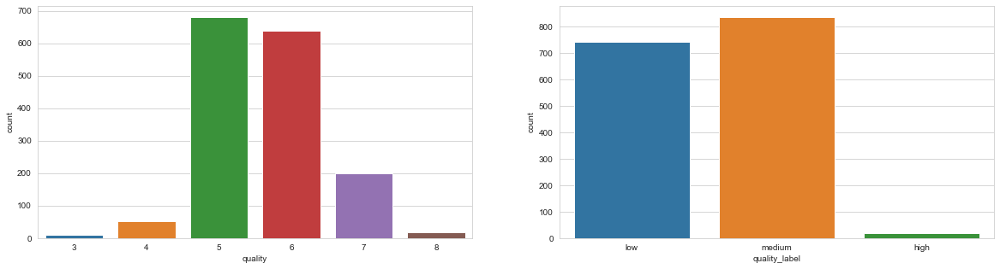

In [9]:
_, axes = plt.subplots(1, 2, figsize=(20, 5))

sns.countplot(data=df_red, x='quality', ax=axes[0])
sns.countplot(data=df_red, x='quality_label', ax=axes[1]);

Well, the dataset is highly imbalanced when it comes to quality attribute.

Let's check some relationships between attributes:

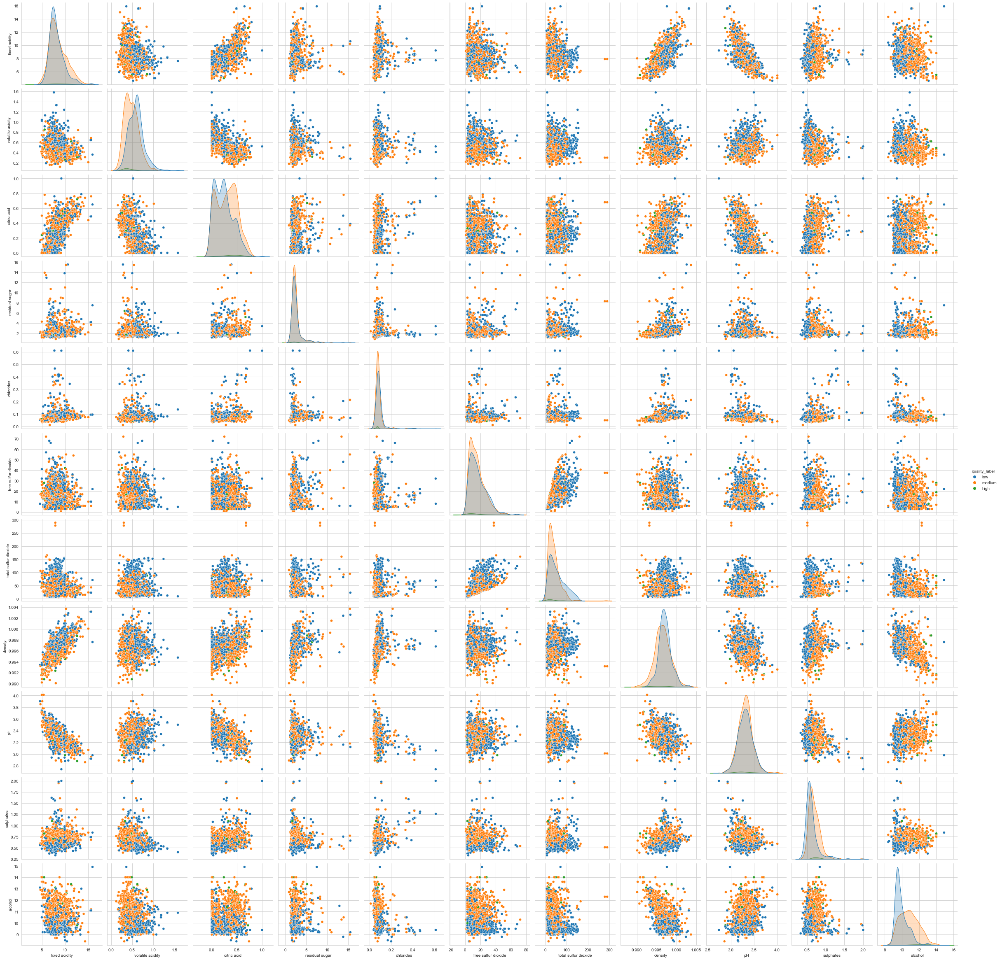

In [10]:
sns.pairplot(df_red.drop(columns=['quality']), hue="quality_label", height=3);

The plot is somehow hard to read. Let's try to focus on an individual attribute:

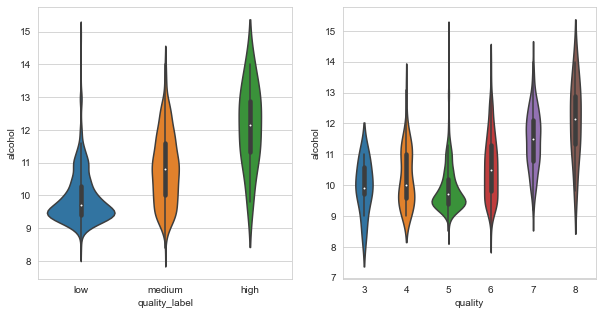

In [11]:
_, axes = plt.subplots(1, 2, figsize=(10, 5))

sns.violinplot(data=df_red, y="alcohol", x="quality_label", ax=axes[0])
sns.violinplot(data=df_red, y="alcohol", x="quality", ax=axes[1]);

There are no obvious gotchas. Maybe we will be more lucky with the correlation plot:

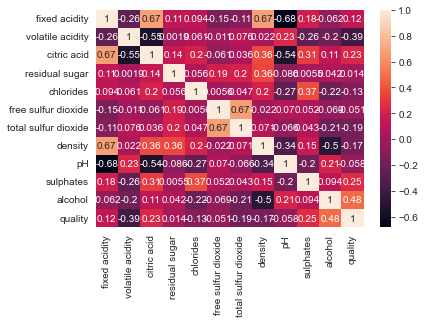

In [12]:
sns.heatmap(df_red.corr(method="pearson"), annot=True);

There are definitely some interactions, we can study them, for example, with _jointplot_:

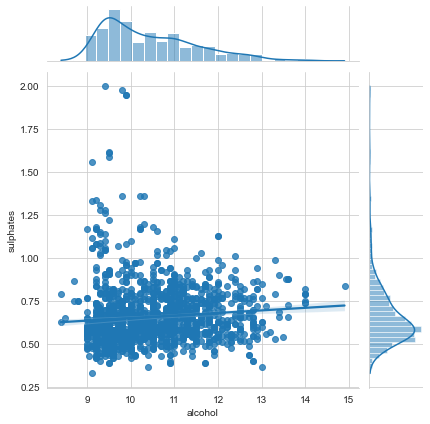

In [13]:
sns.jointplot(x='alcohol',y='sulphates',data=df_red, kind='reg');

Let's analyze relationship between attributes and the quality:

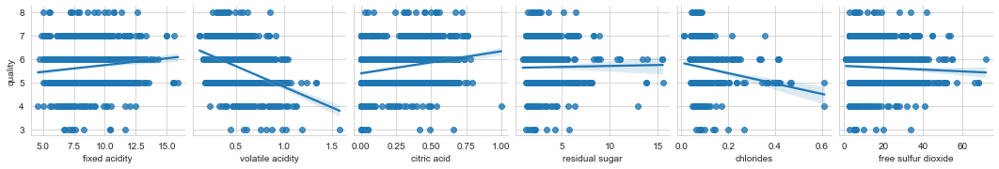

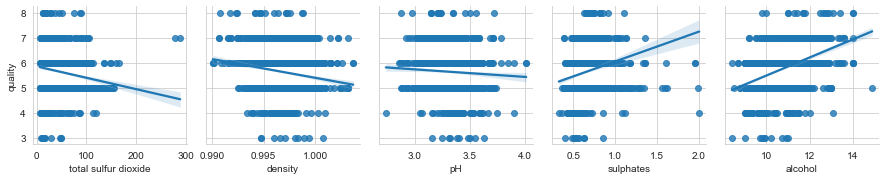

In [14]:
columns = list(filter(lambda col: col not in {'quality', 'wine_category', 'quality_label'}, df_red.columns))
chunks = [columns[i:i + 6] for i in range(0, len(columns), 6)]
for columns_names in chunks:
    sns.pairplot(df_red, x_vars=columns_names, y_vars='quality', kind="reg")

## White Wine Dataset Analysis

Let's run the same analysis for the white vine:

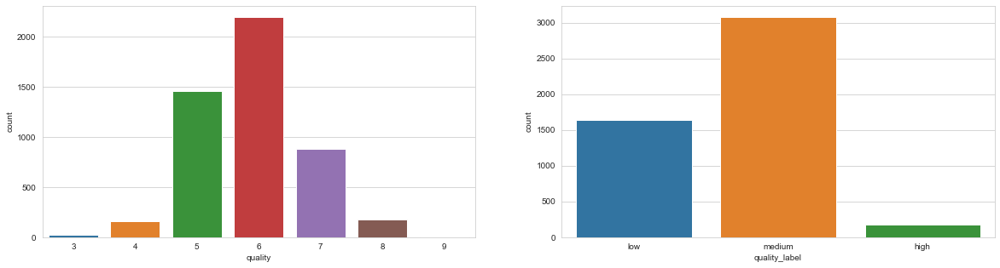

In [15]:
_, axes = plt.subplots(1, 2, figsize=(20, 5))

sns.countplot(data=df_white, x='quality', ax=axes[0])
sns.countplot(data=df_white, x='quality_label', ax=axes[1]);

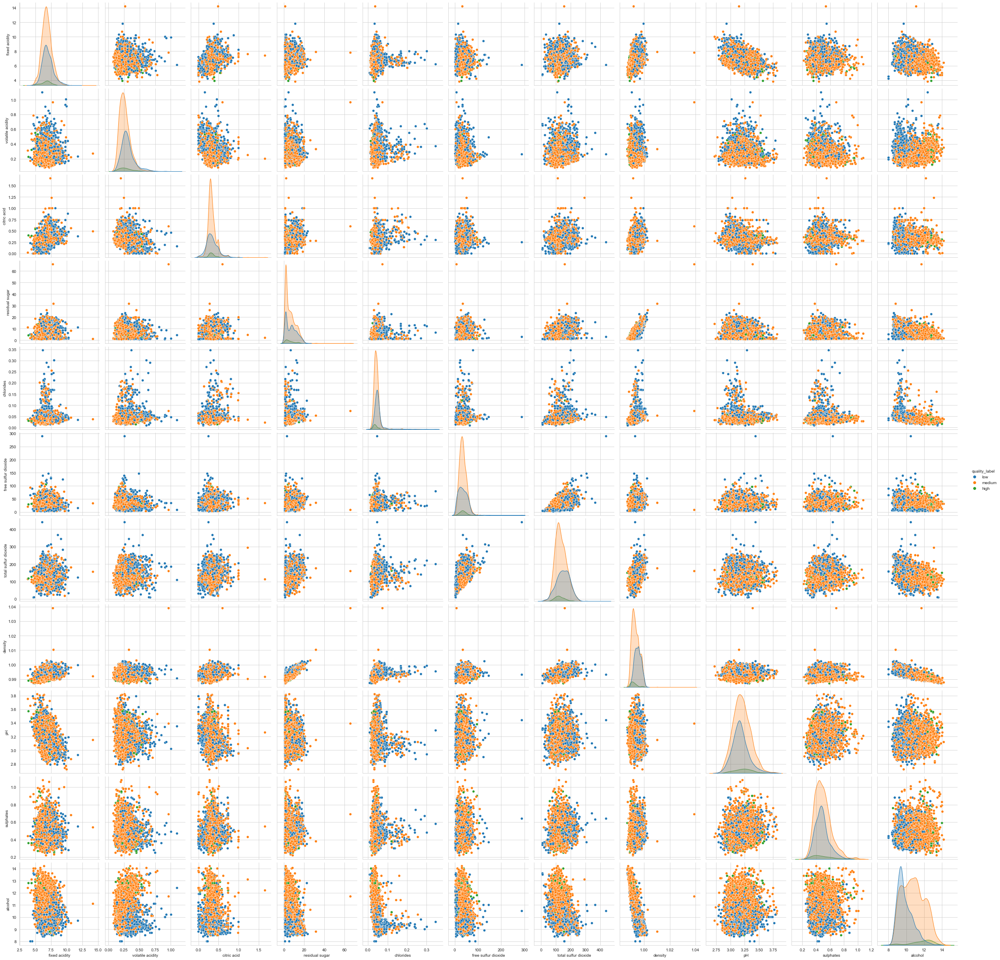

In [16]:
sns.pairplot(df_white.drop(columns=['quality']), hue="quality_label", height=3);

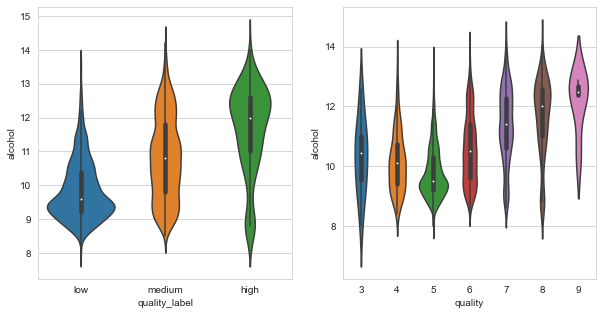

In [17]:
_, axes = plt.subplots(1, 2, figsize=(10, 5))

sns.violinplot(data=df_white, y="alcohol", x="quality_label", ax=axes[0])
sns.violinplot(data=df_white, y="alcohol", x="quality", ax=axes[1]);

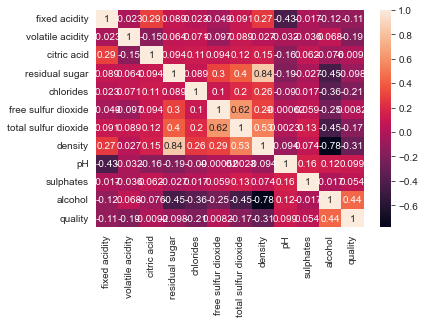

In [18]:
sns.heatmap(df_white.corr(method="pearson"), annot=True);

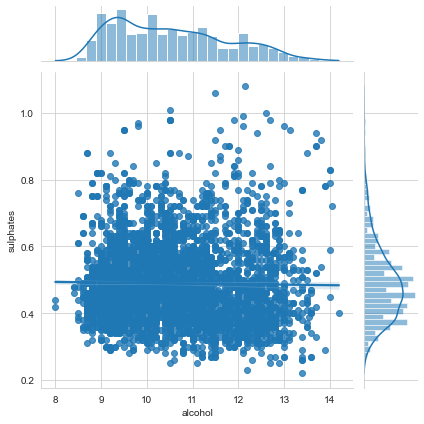

In [19]:
sns.jointplot(x='alcohol',y='sulphates',data=df_white, kind='reg');

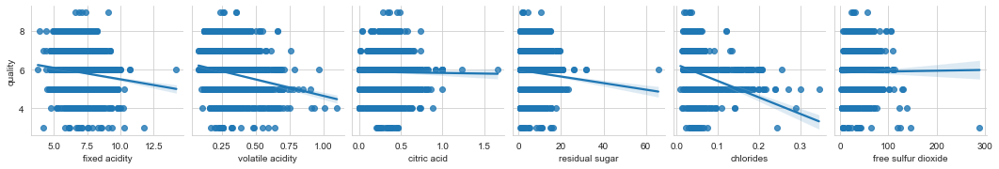

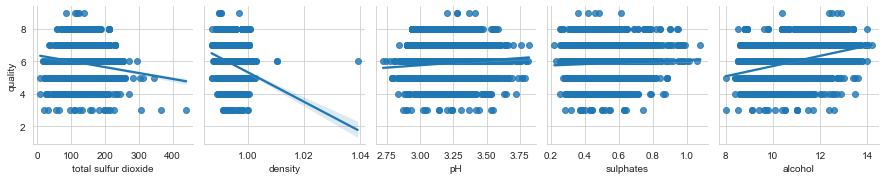

In [20]:
columns = list(filter(lambda col: col not in {'quality', 'wine_category', 'quality_label'}, df_white.columns))
chunks = [columns[i:i + 6] for i in range(0, len(columns), 6)]
for columns_names in chunks:
    sns.pairplot(df_white, x_vars=columns_names, y_vars='quality', kind="reg")

Not surprisingly enough, white wine has a bit of different properties. Let's combine datasets for additional analysis.

## Analyze Combined Data

Let's concatenate datasets together:

In [21]:
df_wines = pd.concat([df_red, df_white])

# re-shuffle records just to randomize data points
df_wines = df_wines.sample(frac=1.0, random_state=42).reset_index(drop=True)
df_wines.head(10)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine_category,quality_label
0,7.0,0.17,0.74,12.8,0.045,24.0,126.0,0.99420,3.26,0.38,12.2,8,white,high
1,7.7,0.64,0.21,2.2,0.077,32.0,133.0,0.99560,3.27,0.45,9.9,5,red,low
2,6.8,0.39,0.34,7.4,0.020,38.0,133.0,0.99212,3.18,0.44,12.0,7,white,medium
3,6.3,0.28,0.47,11.2,0.040,61.0,183.0,0.99592,3.12,0.51,9.5,6,white,medium
4,7.4,0.35,0.20,13.9,0.054,63.0,229.0,0.99888,3.11,0.50,8.9,6,white,medium
5,7.2,0.53,0.14,2.1,0.064,15.0,29.0,0.99323,3.35,0.61,12.1,6,red,medium
6,7.5,0.27,0.31,17.7,0.051,33.0,173.0,0.99900,3.09,0.64,10.2,5,white,low
7,6.8,0.11,0.27,8.6,0.044,45.0,104.0,0.99454,3.20,0.37,9.9,6,white,medium
8,9.0,0.44,0.49,2.4,0.078,26.0,121.0,0.99780,3.23,0.58,9.2,5,red,low
9,7.1,0.23,0.30,2.6,0.034,62.0,148.0,0.99121,3.03,0.56,11.3,7,white,medium


Just by comparing the quality, you can notice a different distributions. For example, the proportion of 5 and 6 is very different for red and white:

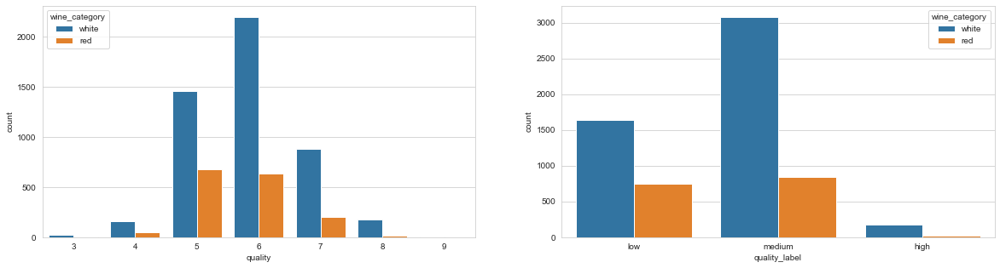

In [22]:
_, axes = plt.subplots(1, 2, figsize=(20, 5))

sns.countplot(data=df_wines, x="quality", hue="wine_category", ax=axes[0])
sns.countplot(data=df_wines, x="quality_label", hue="wine_category", ax=axes[1]);

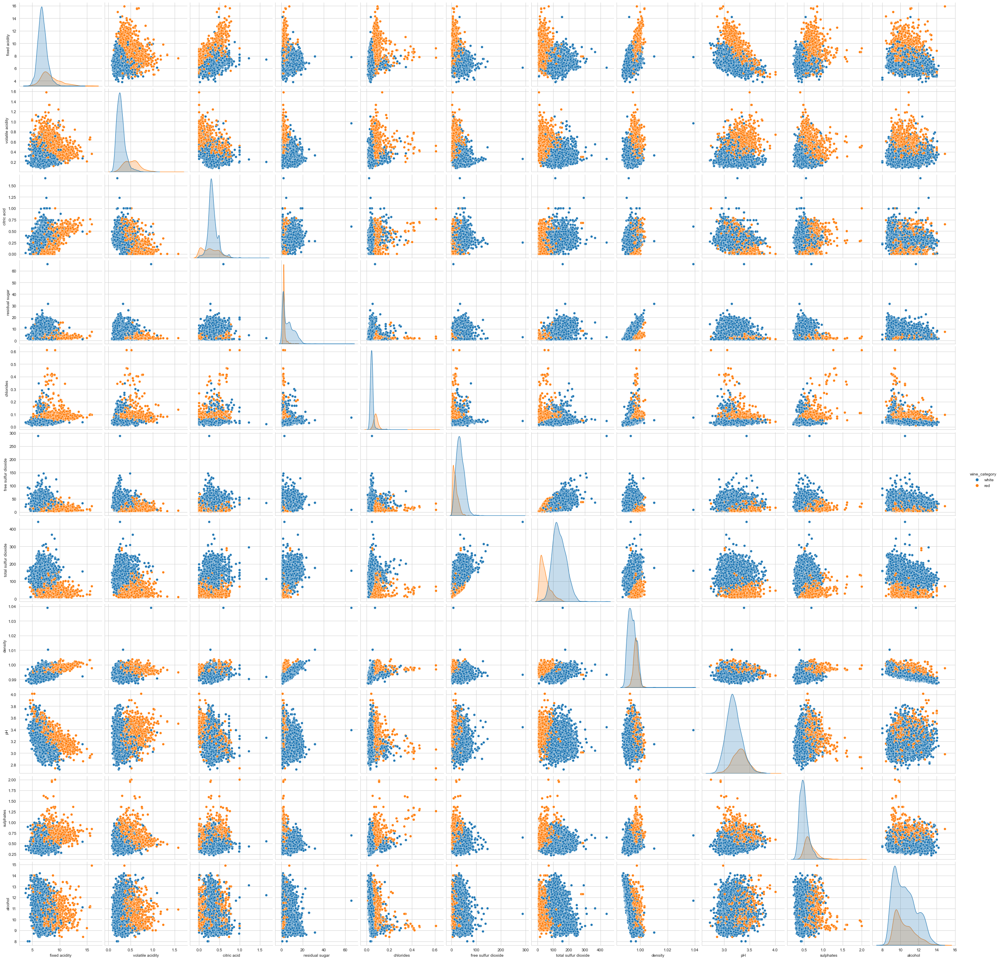

In [23]:
sns.pairplot(df_wines.drop(columns=['quality']), hue="wine_category", height=3);

It seems that separating type of wines might be an easy task to do. Let's check some interactions of combined dataset vs. quality:

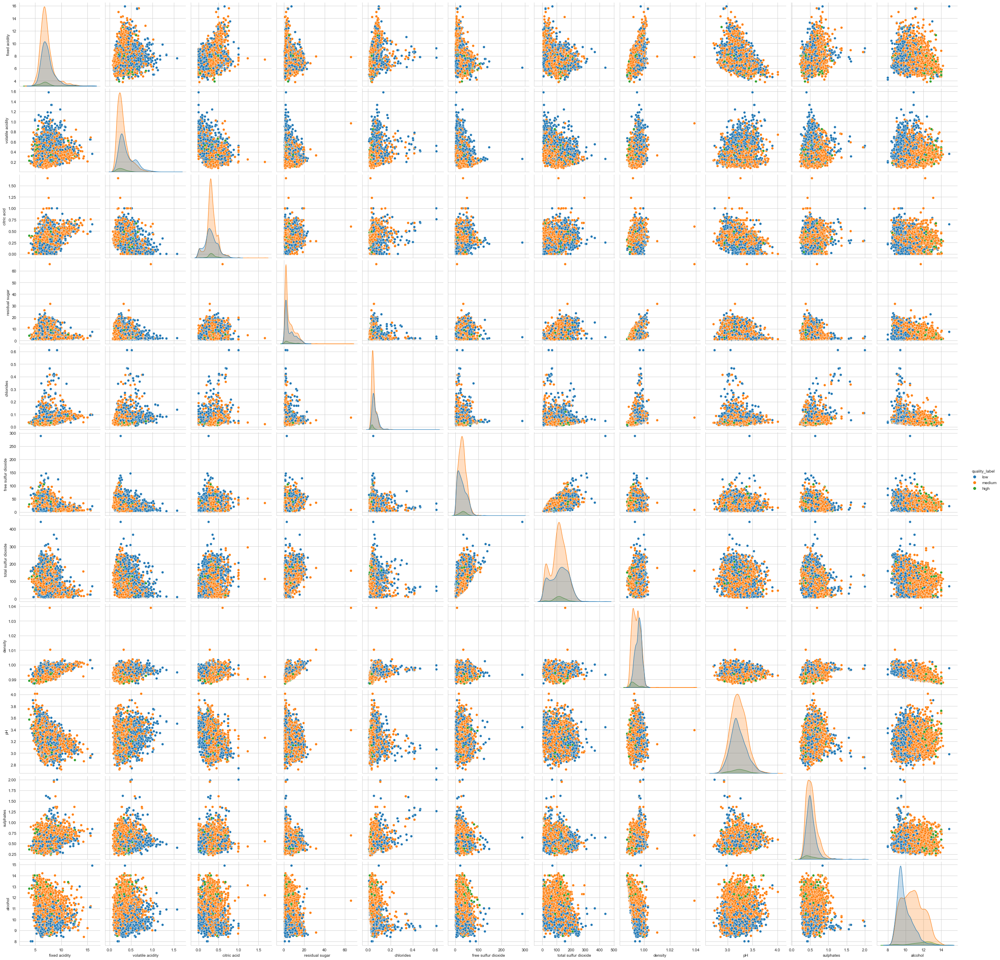

In [24]:
sns.pairplot(df_wines.drop(columns=['quality']), hue="quality_label", height=3);

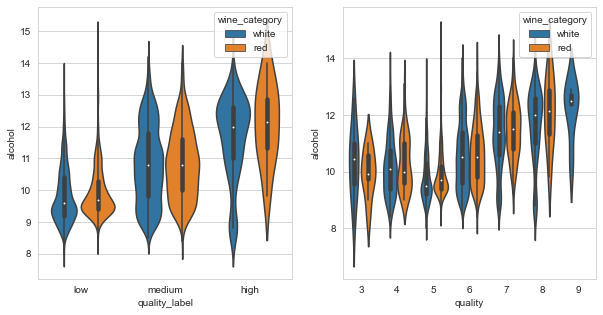

In [25]:
_, axes = plt.subplots(1, 2, figsize=(10, 5))

sns.violinplot(data=df_wines, y="alcohol", x="quality_label", hue="wine_category", ax=axes[0])
sns.violinplot(data=df_wines, y="alcohol", x="quality", hue="wine_category", ax=axes[1]);

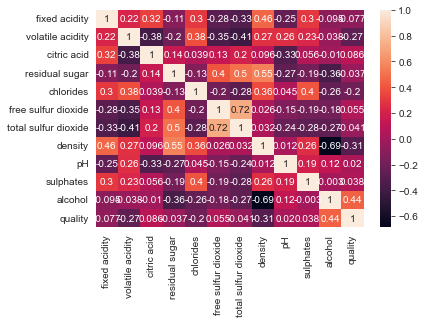

In [26]:
sns.heatmap(df_wines.corr(method="pearson"), annot=True);

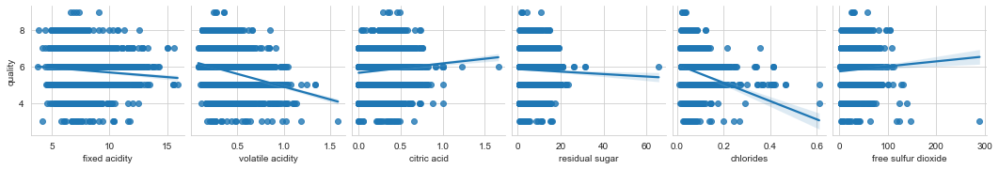

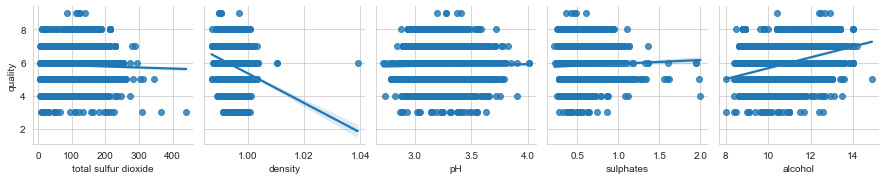

In [27]:
columns = list(filter(lambda col: col not in {'quality', 'wine_category', 'quality_label'}, df_wines.columns))
chunks = [columns[i:i + 6] for i in range(0, len(columns), 6)]
for columns_names in chunks:
    sns.pairplot(df_wines, x_vars=columns_names, y_vars='quality', kind="reg")

To revisit ML tasks mentioned earlier - it is tough to tell if it is better to solve those tasks using individual datasets or the combined one based on the analysis. My bet would be to do it on individual ones, but it depends on what you want to solve and which approach you take. As always, you need to experiment. I can imagine a scenario where, for example, the smaller white wines dataset can benefit from additional data from the red wines.

> ✏️ Several libraries aim to automate EDA to some extent if you want to get some results as quickly as possible. One of them is [pandas-profiling](https://github.com/ydataai/pandas-profiling). An example of automated analysis is [Census Dataset EDA](https://pandas-profiling.ydata.ai/examples/master/census/census_report.html).

## Exercises

#### What sorts of passengers were more likely to survive the Titanic crash?

For the exercise, you will use the famous [Titanic dataset](https://www.kaggle.com/c/titanic). The sinking of the Titanic is one of the most infamous shipwrecks in history.

Unfortunately, there weren't enough lifeboats for everyone onboard on Titanic, resulting in 1502 out of 2224 passengers and crew deaths. While some elements of luck were involved in surviving, some groups of people seemed more likely to survive than others.

In [28]:
# load the dataset
titanic_url = 'https://web.stanford.edu/class/archive/cs/cs109/cs109.1166/stuff/titanic.csv'
titanic_data = pd.read_csv(titanic_url)

# TODO: your answer here

## Resources

```{bibliography}
:filter: docname in docnames
```